In [2]:
import sqlite3
from sql import run
run.prettytable.__dict__.setdefault('DEFAULT', run.prettytable.DEFAULT)

C:\Users\hafiz\AppData\Local\Temp\ipykernel_5480\2944889590.py:3: DeprecationWarning: the 'DEFAULT' constant is deprecated, use the 'TableStyle' enum instead
  run.prettytable.__dict__.setdefault('DEFAULT', run.prettytable.DEFAULT)


<TableStyle.DEFAULT: 10>

In [3]:
%reload_ext sql
%sql sqlite:///nepal_eq.db

Q1 HOW many tables are in the database, what info do they hold

In [4]:
%%sql
select *
from sqlite_schema

 * sqlite:///nepal_eq.db
Done.


[('table', 'building_damage', 'building_damage', 24282, 'CREATE TABLE "building_damage" (\n\t"area_assesed"\tTEXT,\n\t"building_id"\tREAL,\n\t"damage_overall_collapse"\tTEXT,\n\t"damage_overall_leaning"\tTE ... (3025 characters truncated) ... ide"\tINTEGER,\n\t"has_geotechnical_risk_rock_fall"\tINTEGER,\n\t"has_geotechnical_risk_flood"\tINTEGER,\n\t"has_geotechnical_risk_other"\tINTEGER\n)'),
 ('table', 'building_structure', 'building_structure', 78109, 'CREATE TABLE "building_structure" (\n\t"age_building"\tINTEGER,\n\t"building_id"\tREAL,\n\t"condition_post_eq"\tTEXT,\n\t"count_floors_post_eq"\tINTE ... (213 characters truncated) ... _type"\tTEXT,\n\t"plan_configuration"\tTEXT,\n\t"plinth_area_sq_ft"\tINTEGER,\n\t"position"\tTEXT,\n\t"roof_type"\tTEXT,\n\t"superstructure"\tTEXT\n)'),
 ('table', 'household_demographics', 'household_demographics', 109183, 'CREATE TABLE "household_demographics" (\n\t"household_id"\tREAL,\n\t"gender_household_head"\tTEXT,\n\t"age_household_head"\tREAL,\n\t"caste_household ... (15 characters truncated) ... ucation_level_household_head"\tTEXT,\n\t"income_level_household"\tTEXT,\n\t"size_household"\tREAL,\n\t"is_bank_account_present_in_household"\tREAL\n)'),
 ('table', 'id_map', 'id_map', 3, 'CREATE TABLE "id_map" (\n\t"building_id"\tREAL,\n\t"district_id"\tINTEGER,\n\t"vdcmun_id"\tINTEGER,\n\t"household_id"\tTEXT\n)')]

q2. select the name column from the sqlite_schema table, showing only rows where the type is "table".

In [5]:
%%sql
select name from sqlite_schema
where type = 'table'

 * sqlite:///nepal_eq.db
Done.


name
building_damage
building_structure
household_demographics
id_map


In [6]:
%%sql
select *
from id_map
limit 5

 * sqlite:///nepal_eq.db
Done.


building_id,district_id,vdcmun_id,household_id
120101000011.0,12,1207,12010100001101.0
120101000021.0,12,1207,12010100002101.0
120101000031.0,12,1207,12010100003101.0
120101000041.0,12,1207,12010100004101.0
120101000051.0,12,1207,12010100005101.0


In [7]:
total number of rows in id_map
what are unique ids in district_id
how many buildings are in 

SyntaxError: invalid syntax (3775253678.py, line 1)

In [8]:
%%sql
SELECT COUNT(*) AS total_rows
FROM id_map;

 * sqlite:///nepal_eq.db
Done.


total_rows
818786


In [9]:
%%sql
SELECT DISTINCT district_id 
FROM id_map;

 * sqlite:///nepal_eq.db
Done.


district_id
12
20
21
22
23
24
28
29
30
31


In [10]:
%%sql
select count (distinct(building_id))
from id_map

 * sqlite:///nepal_eq.db
Done.


count (distinct(building_id))
762106


In [11]:
%%sql
SELECT *
FROM id_map
WHERE district_id = 36;

 * sqlite:///nepal_eq.db
Done.


building_id,district_id,vdcmun_id,household_id
360106001171.0,36,3609,None
360106001181.0,36,3609,36010600118101.0
360107000161.0,36,3609,36010700016101.0
360107000381.0,36,3609,36010700038101.0
360202000691.0,36,3601,None
360202000701.0,36,3601,36020200070101.0
360202000711.0,36,3601,36020200071101.0
360202000941.0,36,3601,36020200094101.0
360203000351.0,36,3601,36020300035101.0
360203000361.0,36,3601,36020300036101.0


In [12]:
%%sql
select count (distinct(building_id))
from id_map
WHERE district_id = 36;

 * sqlite:///nepal_eq.db
Done.


count (distinct(building_id))
78074


In [13]:
%%sql
select * 
from building_structure
limit 5

 * sqlite:///nepal_eq.db
Done.


age_building,building_id,condition_post_eq,count_floors_post_eq,count_floors_pre_eq,foundation_type,ground_floor_type,height_ft_post_eq,height_ft_pre_eq,land_surface_condition,other_floor_type,plan_configuration,plinth_area_sq_ft,position,roof_type,superstructure
9,120101000011.0,Damaged-Used in risk,1,1,Other,Mud,9,9,Flat,Not applicable,Rectangular,288,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone
15,120101000021.0,Damaged-Repaired and used,1,1,Other,Mud,9,9,Flat,Not applicable,Rectangular,364,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone
20,120101000031.0,Damaged-Repaired and used,1,1,Other,Mud,9,9,Flat,Not applicable,Rectangular,384,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone
20,120101000041.0,Damaged-Repaired and used,1,1,Other,Mud,9,9,Flat,Not applicable,Rectangular,312,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone
30,120101000051.0,Damaged-Repaired and used,1,1,Other,Mud,9,9,Flat,Not applicable,Rectangular,308,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone


In [14]:
%%sql
 select count (8)
from building_structure

 * sqlite:///nepal_eq.db
Done.


count (8)
762106


In [15]:
%%sql
SELECT *
FROM id_map
JOIN building_structure 
ON id_map.building_id = building_structure.building_id
WHERE id_map.district_id = 36
LIMIT 4;

 * sqlite:///nepal_eq.db
Done.


building_id,district_id,vdcmun_id,household_id,age_building,building_id_1,condition_post_eq,count_floors_post_eq,count_floors_pre_eq,foundation_type,ground_floor_type,height_ft_post_eq,height_ft_pre_eq,land_surface_condition,other_floor_type,plan_configuration,plinth_area_sq_ft,position,roof_type,superstructure
360106001171.0,36,3609,None,4,360106001171.0,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,18,Flat,TImber/Bamboo-Mud,Rectangular,280,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone
360106001181.0,36,3609,36010600118101.0,15,360106001181.0,Damaged-Rubble unclear,0,1,Mud mortar-Stone/Brick,Mud,0,18,Flat,Not applicable,Rectangular,120,Attached-1 side,Bamboo/Timber-Light roof,mud_mortar_stone
360107000161.0,36,3609,36010700016101.0,25,360107000161.0,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,14,Flat,TImber/Bamboo-Mud,Rectangular,300,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone
360107000381.0,36,3609,36010700038101.0,22,360107000381.0,Damaged-Rubble clear,0,2,Mud mortar-Stone/Brick,Mud,0,16,Flat,TImber/Bamboo-Mud,Rectangular,155,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone


In [16]:
%%sql
select distinct (id_map.building_id), 
building_structure.*
from id_map
join building_structure 
on id_map.building_id = building_structure.building_id
WHERE id_map.district_id = 36
LIMIT 3;

 * sqlite:///nepal_eq.db
Done.


building_id,age_building,building_id_1,condition_post_eq,count_floors_post_eq,count_floors_pre_eq,foundation_type,ground_floor_type,height_ft_post_eq,height_ft_pre_eq,land_surface_condition,other_floor_type,plan_configuration,plinth_area_sq_ft,position,roof_type,superstructure
360106001171.0,4,360106001171.0,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,18,Flat,TImber/Bamboo-Mud,Rectangular,280,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone
360106001181.0,15,360106001181.0,Damaged-Rubble unclear,0,1,Mud mortar-Stone/Brick,Mud,0,18,Flat,Not applicable,Rectangular,120,Attached-1 side,Bamboo/Timber-Light roof,mud_mortar_stone
360107000161.0,25,360107000161.0,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,14,Flat,TImber/Bamboo-Mud,Rectangular,300,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone


In [17]:
%%sql
SELECT damage_grade from building_damage
limit 5

 * sqlite:///nepal_eq.db
Done.


damage_grade
Grade 3
Grade 5
Grade 2
Grade 2
Grade 1


In [18]:
%%sql
SELECT DISTINCT id_map.building_id, 
       building_structure.*, 
       building_damage.damage_grade
FROM id_map
JOIN building_structure 
    ON id_map.building_id = building_structure.building_id
JOIN building_damage 
    ON id_map.building_id = building_damage.building_id
WHERE id_map.district_id = 36
LIMIT 5;

 * sqlite:///nepal_eq.db
Done.


building_id,age_building,building_id_1,condition_post_eq,count_floors_post_eq,count_floors_pre_eq,foundation_type,ground_floor_type,height_ft_post_eq,height_ft_pre_eq,land_surface_condition,other_floor_type,plan_configuration,plinth_area_sq_ft,position,roof_type,superstructure,damage_grade
360106001171.0,4,360106001171.0,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,18,Flat,TImber/Bamboo-Mud,Rectangular,280,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
360106001181.0,15,360106001181.0,Damaged-Rubble unclear,0,1,Mud mortar-Stone/Brick,Mud,0,18,Flat,Not applicable,Rectangular,120,Attached-1 side,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
360107000161.0,25,360107000161.0,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,14,Flat,TImber/Bamboo-Mud,Rectangular,300,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
360107000381.0,22,360107000381.0,Damaged-Rubble clear,0,2,Mud mortar-Stone/Brick,Mud,0,16,Flat,TImber/Bamboo-Mud,Rectangular,155,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
360202000691.0,20,360202000691.0,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Brick/Stone,0,14,Flat,TImber/Bamboo-Mud,Rectangular,240,Attached-1 side,Bamboo/Timber-Heavy roof,mud_mortar_stone,Grade 5


In [19]:
conn = sqlite3.connect("C:\\Users\\hafiz\\Documents\\Gomycode\\nepal_eq.db")

In [20]:
query = '''SELECT DISTINCT id_map.building_id as b_id,building_structure.*, building_damage.damage_grade
FROM id_map
JOIN building_structure 
    ON id_map.building_id = building_structure.building_id
JOIN building_damage 
    ON id_map.building_id = building_damage.building_id
WHERE id_map.district_id = 36;'''
print(query)

SELECT DISTINCT id_map.building_id as b_id,building_structure.*, building_damage.damage_grade
FROM id_map
JOIN building_structure 
    ON id_map.building_id = building_structure.building_id
JOIN building_damage 
    ON id_map.building_id = building_damage.building_id
WHERE id_map.district_id = 36;


In [21]:
import pandas as pd

In [22]:
data = pd.read_sql(query, conn, index_col='b_id')
data.head()

,age_building,building_id,condition_post_eq,count_floors_post_eq,count_floors_pre_eq,foundation_type,ground_floor_type,height_ft_post_eq,height_ft_pre_eq,land_surface_condition,other_floor_type,plan_configuration,plinth_area_sq_ft,position,roof_type,superstructure,damage_grade
b_id,,,,,,,,,,,,,,,,,
3.601060e+11,4,3.601060e+11,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,18,Flat,TImber/Bamboo-Mud,Rectangular,280,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
3.601060e+11,15,3.601060e+11,Damaged-Rubble unclear,0,1,Mud mortar-Stone/Brick,Mud,0,18,Flat,Not applicable,Rectangular,120,Attached-1 side,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
3.601070e+11,25,3.601070e+11,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Mud,0,14,Flat,TImber/Bamboo-Mud,Rectangular,300,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
3.601070e+11,22,3.601070e+11,Damaged-Rubble clear,0,2,Mud mortar-Stone/Brick,Mud,0,16,Flat,TImber/Bamboo-Mud,Rectangular,155,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,Grade 5
3.602020e+11,20,3.602020e+11,Damaged-Rubble unclear,0,2,Mud mortar-Stone/Brick,Brick/Stone,0,14,Flat,TImber/Bamboo-Mud,Rectangular,240,Attached-1 side,Bamboo/Timber-Heavy roof,mud_mortar_stone,Grade 5


In [7]:
data.to_csv('nepal_eq.csv', index=False)

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [9]:
from category_encoders import OneHotEncoder

In [10]:
data = pd.read_csv('nepal_eq')

In [11]:
data. info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78074 entries, 0 to 78073
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   age_building            78074 non-null  int64  
 1   building_id             78074 non-null  float64
 2   condition_post_eq       78074 non-null  object 
 3   count_floors_post_eq    78074 non-null  int64  
 4   count_floors_pre_eq     78074 non-null  int64  
 5   foundation_type         78074 non-null  object 
 6   ground_floor_type       78074 non-null  object 
 7   height_ft_post_eq       78074 non-null  int64  
 8   height_ft_pre_eq        78074 non-null  int64  
 9   land_surface_condition  78074 non-null  object 
 10  other_floor_type        78074 non-null  object 
 11  plan_configuration      78074 non-null  object 
 12  plinth_area_sq_ft       78074 non-null  int64  
 13  position                78074 non-null  object 
 14  roof_type               78074 non-null

In [12]:
drop_cols = [col for col in data.columns if 'post_eq' in col]

In [13]:
data['damage_grade'] = data['damage_grade'].astype(str).str[-1].astype(int)
data['severe_damage'] = (data['damage_grade'] > 3).astype(int)
# Drop 'damage_grade' column
drop_cols.append('damage_grade')

<Axes: >

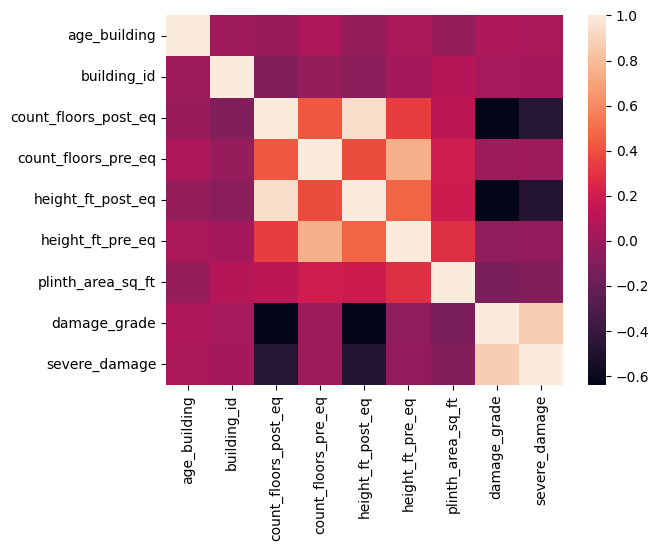

In [14]:
correlation = data.select_dtypes('number').corr()
sns.heatmap(correlation)

In [15]:
#drop high cadinality
drop_cols.extend(['building_id', 'count_floors_pre_eq'])

In [16]:
import sqlite3
import pandas as pd

def wrangle(db_path):
    # Connect to the SQLite database
    conn = sqlite3.connect(db_path)
    
    # Define the SQL query
    query = '''
    SELECT DISTINCT id_map.building_id as b_id, building_structure.*, building_damage.damage_grade
    FROM id_map
    JOIN building_structure 
        ON id_map.building_id = building_structure.building_id
    JOIN building_damage 
        ON id_map.building_id = building_damage.building_id
    WHERE id_map.district_id = 36;
    '''
    # Execute the query and load the data into a DataFrame
    data = pd.read_sql_query(query, conn)
    # Close the database connection
    conn.close()
    # Drop columns with 'post_eq' in their names
    drop_cols = [col for col in data.columns if 'post_eq' in col]
    # Convert 'damage_grade' to string, extract the last character, and convert to integer
    data['damage_grade'] = data['damage_grade'].astype(str).str[-1].astype(int)
    # Create a new column 'severe_damage' based on 'damage_grade'
    data['severe_damage'] = (data['damage_grade'] > 3).astype(int)
    # Drop the 'damage_grade' column
    drop_cols.append('damage_grade')
    # Drop high cardinality columns
    drop_cols.extend(['building_id', 'count_floors_pre_eq'])
    # Drop the specified columns
    data.drop(columns=drop_cols, inplace=True)
    
    return data


In [17]:
data = wrangle("C:\\Users\\hafiz\\Documents\\Gomycode\\nepal_eq.db")
data. head()

,b_id,age_building,foundation_type,ground_floor_type,height_ft_pre_eq,land_surface_condition,other_floor_type,plan_configuration,plinth_area_sq_ft,position,roof_type,superstructure,severe_damage
0,3.601060e+11,4,Mud mortar-Stone/Brick,Mud,18,Flat,TImber/Bamboo-Mud,Rectangular,280,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,1
1,3.601060e+11,15,Mud mortar-Stone/Brick,Mud,18,Flat,Not applicable,Rectangular,120,Attached-1 side,Bamboo/Timber-Light roof,mud_mortar_stone,1
2,3.601070e+11,25,Mud mortar-Stone/Brick,Mud,14,Flat,TImber/Bamboo-Mud,Rectangular,300,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,1
3,3.601070e+11,22,Mud mortar-Stone/Brick,Mud,16,Flat,TImber/Bamboo-Mud,Rectangular,155,Not attached,Bamboo/Timber-Light roof,mud_mortar_stone,1
4,3.602020e+11,20,Mud mortar-Stone/Brick,Brick/Stone,14,Flat,TImber/Bamboo-Mud,Rectangular,240,Attached-1 side,Bamboo/Timber-Heavy roof,mud_mortar_stone,1


In [18]:
print(data["severe_damage"].value_counts())

severe_damage
1    49661
0    28413
Name: count, dtype: int64


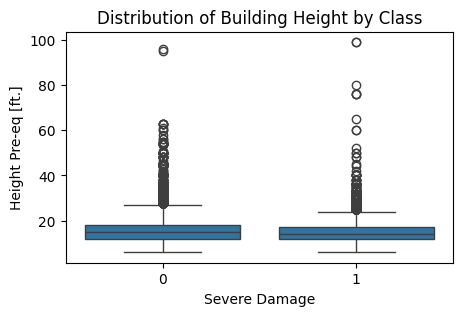

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(5,3))
sns.boxplot(x='severe_damage', y='height_ft_pre_eq', data=data)  # Closed parentheses

# Label axes
plt.xlabel('Severe Damage')
plt.ylabel('Height Pre-eq [ft.]')
plt.title('Distribution of Building Height by Class')

plt.show()  

<Axes: title={'center': 'class Blance'}, xlabel='class', ylabel='Relative Frequency'>

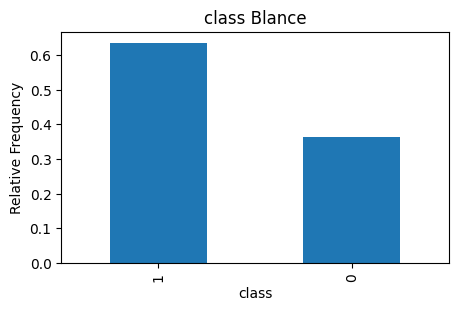

In [20]:
plt.figure(figsize=(5,3))
data['severe_damage'].value_counts(normalize=True).plot(
    kind='bar',
    xlabel='class', ylabel='Relative Frequency', title='class Blance',
)


In [21]:
majority_class_prop, minority_class_prop =data['severe_damage'].value_counts(normalize=True)
(majority_class_prop, minority_class_prop)    

(0.6360760304326665, 0.3639239695673336)

In [22]:
foundation_pivot = pd.pivot_table(
    data, index='foundation_type', values='severe_damage'
).sort_values(by='severe_damage')
foundation_pivot

,severe_damage
foundation_type,
RC,0.027134
Bamboo/Timber,0.321429
Cement-Stone/Brick,0.410200
Mud mortar-Stone/Brick,0.684101
Other,0.801020


<Figure size 500x300 with 0 Axes>

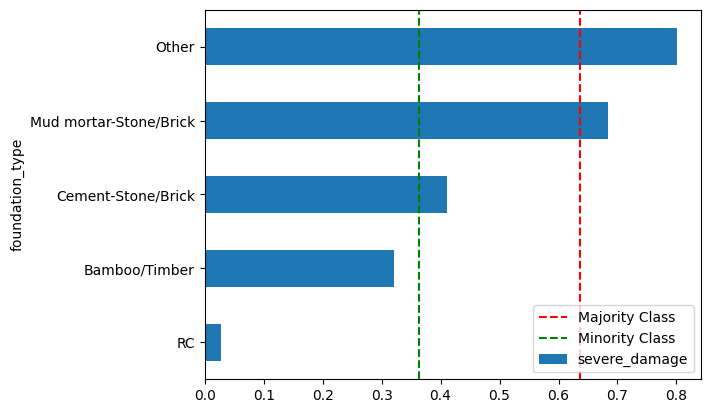

In [23]:

plt.figure(figsize=(5,3))

foundation_pivot.plot(kind='barh')

plt.axvline(
    majority_class_prop, linestyle='--', color='red', label='Majority Class'
) 
plt.axvline(
    minority_class_prop, linestyle='--', color='green', label='Minority Class'
)  
plt.legend(loc='lower right')
plt.show()

In [24]:
data.select_dtypes('object').nunique()

foundation_type            5
ground_floor_type          5
land_surface_condition     3
other_floor_type           4
plan_configuration        10
position                   4
roof_type                  3
superstructure            11
dtype: int64

In [25]:
target = 'severe_damage'
feature = data.drop('severe_damage', axis=1)
X = feature
y = data[target]

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)

In [27]:
acc_baseline = y_train.value_counts(normalize=True).max()
print("Baseline accuracy:", round(acc_baseline, 2))

Baseline accuracy: 0.64


In [28]:
from category_encoders import OneHotEncoder

In [34]:
model1 = make_pipeline(
    OneHotEncoder(use_cat_names=True), 
    StandardScaler(),
    LogisticRegression()
)

model1.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['foundation_type', 'ground_floor_type',
                                     'land_surface_condition',
                                     'other_floor_type', 'plan_configuration',
                                     'position', 'roof_type',
                                     'superstructure'],
                               use_cat_names=True)),
                ('standardscaler', StandardScaler()),
                ('logisticregression', LogisticRegression())])

In [37]:
features = model1.named_steps['onehotencoder'].get_feature_names_out()
importances = model1.named_steps['logisticregression'].coef_[0]

In [38]:
feat_imp = pd.Series(np.exp(importances), index=features).sort_values()
feat_imp.head()

superstructure_cement_mortar_brick    0.770582
foundation_type_RC                    0.798834
superstructure_rc_non_engineered      0.821813
roof_type_RCC/RB/RBC                  0.826318
ground_floor_type_RC                  0.868638
dtype: float64

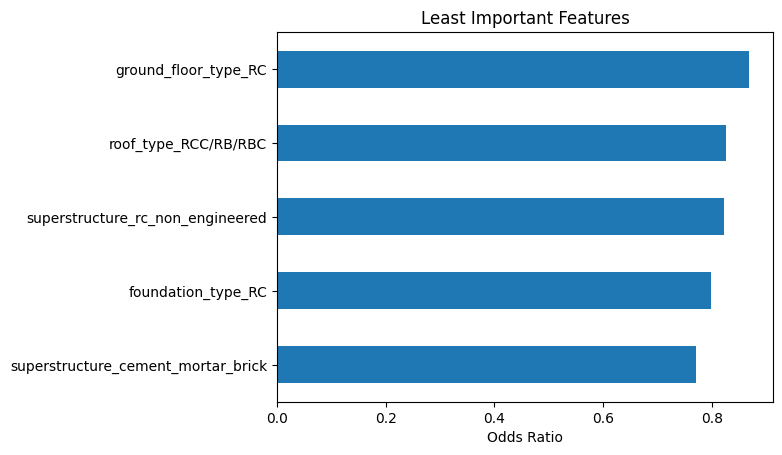

In [40]:
feat_imp.head().plot(kind='barh')
plt.xlabel('Odds Ratio')
plt.title('Least Important Features')
plt.show()

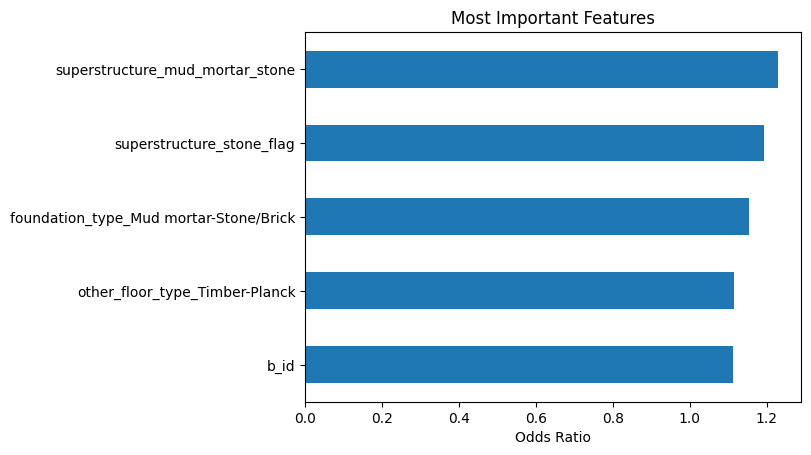

In [41]:
feat_imp.tail().plot(kind='barh')
plt.xlabel('Odds Ratio')
plt.title('Most Important Features')
plt.show()

In [52]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from category_encoders import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

In [64]:
data = data.drop('b_id', axis=1)

In [65]:
target = 'severe_damage'
features = data.drop('severe_damage', axis=1)
X = features
y = data[target]

In [66]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)

In [67]:
acc_baseline = y_train.value_counts(normalize=True).max()
print("Baseline accuracy:", round(acc_baseline, 2))

Baseline accuracy: 0.64


In [68]:
model = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    StandardScaler(),
    DecisionTreeClassifier(random_state=30, max_depth=5)  
)

model.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['foundation_type', 'ground_floor_type',
                                     'land_surface_condition',
                                     'other_floor_type', 'plan_configuration',
                                     'position', 'roof_type',
                                     'superstructure'],
                               use_cat_names=True)),
                ('standardscaler', StandardScaler()),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(max_depth=5, random_state=30))])

In [73]:
X_train.columns

Index(['age_building', 'foundation_type', 'ground_floor_type',
       'height_ft_pre_eq', 'land_surface_condition', 'other_floor_type',
       'plan_configuration', 'plinth_area_sq_ft', 'position', 'roof_type',
       'superstructure'],
      dtype='object')

In [74]:
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Decision Tree Accuracy:", accuracy)
print("\nClassification Report:\n", classification_report(y_test, y_pred));

Decision Tree Accuracy: 0.7036183157220621

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.23      0.37      5732
           1       0.69      0.98      0.81      9883

    accuracy                           0.70     15615
   macro avg       0.77      0.60      0.59     15615
weighted avg       0.75      0.70      0.65     15615



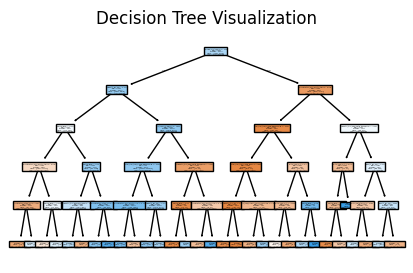

In [75]:
decision_tree = model.named_steps['decisiontreeclassifier'] 
plt.figure(figsize=(5, 3))
plot_tree(
    decision_tree,
    feature_names=model.named_steps['onehotencoder'].get_feature_names_out(),
    class_names=['No Severe Damage', 'Severe Damage'],  
    filled=True
)
plt.title("Decision Tree Visualization")
plt.show()

In [72]:
import pickle



with open ('nepal_model.pkl', 'wb') as f:
    pickle.dump(model, f)

In [60]:
X_test.head

<bound method NDFrame.head of                b_id  age_building         foundation_type ground_floor_type  \
65818  3.656070e+11            25  Mud mortar-Stone/Brick       Brick/Stone   
10034  3.609090e+11            20  Mud mortar-Stone/Brick               Mud   
53032  3.649050e+11            15  Mud mortar-Stone/Brick               Mud   
34164  3.630090e+11            12  Mud mortar-Stone/Brick               Mud   
48923  3.646050e+11            62  Mud mortar-Stone/Brick               Mud   
...             ...           ...                     ...               ...   
31917  3.628070e+11            35  Mud mortar-Stone/Brick               Mud   
40470  3.639010e+11            20  Mud mortar-Stone/Brick            Timber   
48914  3.646050e+11            36  Mud mortar-Stone/Brick               Mud   
56864  3.650060e+11             4                      RC                RC   
65138  3.655070e+11            23  Mud mortar-Stone/Brick               Mud   

       height_ft_pre_